# ESM-MLM-FCN BE
---
## Predicted vs Measured
### Extracting the values

In [4]:
import os
import sys
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader as TorchDataLoader
from torch_geometric.loader import DataLoader as GeometricDataLoader

import lightning as L

from transformers import EsmTokenizer, EsmForMaskedLM

class DmsBeDataset(Dataset):
    def __init__(self, csv_file:str):
        """
        Load from csv file into pandas:
        - sequence label ('labels'), 
        - 'sequence',
        - binding target
        - expression target
        """
        try:
            self.full_df = pd.read_csv(csv_file, sep=',', header=0)
        except (FileNotFoundError, pd.errors.ParserError, Exception) as e:
            print(f"Error reading in .csv file: {csv_file}\n{e}", file=sys.stderr)
            sys.exit(1)

    def __len__(self) -> int:
        return len(self.full_df)

    def __getitem__(self, idx):
        # label, seq, binding target, expression target
        return self.full_df['label'][idx], self.full_df['sequence'][idx], self.full_df['ACE2-binding_affinity'][idx], self.full_df['RBD_expression'][idx]

class DmsBeDataModule(L.LightningDataModule):
    def __init__(self, data_dir: str, torch_geometric_tag: bool, batch_size: int, num_workers: int, seed: int):
        super().__init__()
        self.data_dir = data_dir
        self.torch_geometric_tag = torch_geometric_tag
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.seed = seed

        # Set seeds globally for reproducibility
        L.seed_everything(self.seed, workers=True)

    def setup(self, stage):
        # Called on every GPU
        if stage == 'fit':
            self.train_dataset = DmsBeDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_train.csv"))
            self.val_dataset = DmsBeDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_test.csv"))

    def train_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.train_dataset, 
            batch_size=self.batch_size, 
            shuffle=True, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )
        
    def val_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.val_dataset, 
            batch_size=self.batch_size, 
            shuffle=False, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )

class FCN_BE(L.LightningModule):
    """ Fully Connected Network """

    def __init__(self,
                 fcn_input_size,    # The number of input features
                 fcn_hidden_size,   # The number of features in hidden layer of FCN.
                 fcn_num_layers):   # The number of fcn layers  
        super().__init__()

        # Creating a list of layers for the FCN
        # Subsequent layers after 1st should be equal to hidden_size for input_size
        layers = []
        input_size = fcn_input_size

        for _ in range(fcn_num_layers):
            layers.append(nn.Linear(input_size, fcn_hidden_size))
            layers.append(nn.ReLU())
            input_size = fcn_hidden_size

        # FCN layers
        self.fcn = nn.Sequential(*layers)

        # FCN output layers - two separate heads for binding and expression
        self.binding_out = nn.Linear(fcn_hidden_size, 1)
        self.expression_out = nn.Linear(fcn_hidden_size, 1)

    def forward(self, x):
        fcn_out = self.fcn(x)

        # Task-specific predictions
        binding_prediction = self.binding_out(fcn_out).squeeze(1) # [batch_size]
        expression_prediction = self.expression_out(fcn_out).squeeze(1) # [batch_size]

        return binding_prediction, expression_prediction

class LightningEsmFcnBe(L.LightningModule):
    def __init__(self, 
                 script_letter:str,
                 lr: float, max_len: int, mask_prob: float, fcn_model: FCN_BE, esm_version="facebook/esm2_t6_8M_UR50D", from_saved=None):
        super().__init__()
        self.script_letter = script_letter
        self.tokenizer = EsmTokenizer.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.esm = EsmForMaskedLM.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.fcn = fcn_model
        self.lr = lr
        self.max_len = max_len
        self.mask_prob = mask_prob
        self.batch_dataframes = []

        # Load fine-tuned weights 
        if from_saved is not None:
            if trainer.global_rank == 0: print(f"Loading model checkpoint from {from_saved}...")

            ckpt = torch.load(from_saved, map_location="cpu")
            state_dict = ckpt["state_dict"]
            self.load_state_dict(state_dict, strict=True)

    def forward(self, input_ids, attention_mask):
        esm_output = self.esm(input_ids=input_ids, attention_mask=attention_mask, labels=None, output_hidden_states=True)
        esm_last_hidden_state = esm_output.hidden_states[-1] # shape: [batch_size, sequence_length, embedding_dim]
        esm_cls_embedding = esm_last_hidden_state[:, 0, :]  # CLS token embedding (sequence-level representations), [batch_size, embedding_dim]
        binding_preds, expression_preds = self.fcn(esm_cls_embedding) # [batch_size], [batch_size]
        return esm_output, binding_preds, expression_preds
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

    def training_step(self, batch, batch_idx):
        seq_ids, seqs, binding_targets, expression_targets = batch
        binding_targets = binding_targets.to(self.device).float()
        expression_targets = expression_targets.to(self.device).float()
        batch_size = binding_targets.size(0)

        # Tokenize sequences
        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}
        original_ids = tokenized["input_ids"]
        attention_mask = tokenized["attention_mask"]

        # Generate new mask for each epoch (ignore special tokens)
        rand = torch.rand(original_ids.shape, device=self.device)
        mask_arr = (rand < self.mask_prob) * \
               (original_ids != self.tokenizer.cls_token_id) * \
               (original_ids != self.tokenizer.eos_token_id) * \
               (original_ids != self.tokenizer.pad_token_id)
    
        masked_original_ids = original_ids.clone()
        masked_original_ids[mask_arr] = self.tokenizer.mask_token_id

        # Forward pass, calculate loss
        mlm_output, binding_regression_preds, expression_regression_preds = self(input_ids=masked_original_ids, attention_mask=attention_mask)
        
        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "binding_measured_value": [target.item() for target in binding_targets],
            "binding_predicted_value": [pred.item() for pred in binding_regression_preds],
            "expression_measured_value": [target.item() for target in expression_targets],
            "expression_predicted_value": [pred.item() for pred in expression_regression_preds],
            "mode": ["train"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def validation_step(self, batch, batch_idx):
        seq_ids, seqs, binding_targets, expression_targets = batch
        binding_targets = binding_targets.to(self.device).float()
        expression_targets = expression_targets.to(self.device).float()
        batch_size = binding_targets.size(0)

        # Tokenize sequences
        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}
        original_ids = tokenized["input_ids"]
        attention_mask = tokenized["attention_mask"]

        # Generate new mask for each epoch (ignore special tokens)
        rand = torch.rand(original_ids.shape, device=self.device)
        mask_arr = (rand < self.mask_prob) * \
               (original_ids != self.tokenizer.cls_token_id) * \
               (original_ids != self.tokenizer.eos_token_id) * \
               (original_ids != self.tokenizer.pad_token_id)
    
        masked_original_ids = original_ids.clone()
        masked_original_ids[mask_arr] = self.tokenizer.mask_token_id

        # Forward pass, calculate loss
        mlm_output, binding_regression_preds, expression_regression_preds = self(input_ids=masked_original_ids, attention_mask=attention_mask)
        
        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "binding_measured_value": [target.item() for target in binding_targets],
            "binding_predicted_value": [pred.item() for pred in binding_regression_preds],
            "expression_measured_value": [target.item() for target in expression_targets],
            "expression_predicted_value": [pred.item() for pred in expression_regression_preds],
            "mode": ["test"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def on_fit_end(self):
        # Concatenate all batch DataFrames into one and save
        result_df = pd.concat(self.batch_dataframes, ignore_index=True)
        result_df.to_csv(f"scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.{self.script_letter}-predicted_vs_measured.values.csv", index=False)
        print("Saved prediction vs measured values.")

A

In [6]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "A"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-4,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045123/ckpt/best_model-epoch=898.val_be_rmse=2.0976.val_binding_rmse=1.8578.val_expression_rmse=0.9739.val_mlm_accuracy=6.5062.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045123/ckpt/best_model-epoch=898.val_be_rmse=2.0976.val_binding_rmse=1.8578.val_expression_rmse=0.9739.val_mlm_accuracy=6.5062.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.89it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.89it/s]
Saved prediction vs measured values.


B

In [8]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "B"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-5,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045124/ckpt/best_model-epoch=981.val_be_rmse=2.1078.val_binding_rmse=1.8672.val_expression_rmse=0.9780.val_mlm_accuracy=6.5781.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045124/ckpt/best_model-epoch=981.val_be_rmse=2.1078.val_binding_rmse=1.8672.val_expression_rmse=0.9780.val_mlm_accuracy=6.5781.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.87it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.87it/s]
Saved prediction vs measured values.


C

In [9]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "C"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-4,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22047980/ckpt/best_model-epoch=145.val_be_rmse=1.1965.val_binding_rmse=1.0452.val_expression_rmse=0.5825.val_mlm_accuracy=98.3934.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22047980/ckpt/best_model-epoch=145.val_be_rmse=1.1965.val_binding_rmse=1.0452.val_expression_rmse=0.5825.val_mlm_accuracy=98.3934.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.85it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:58<00:00, 10.85it/s]
Saved prediction vs measured values.


D

In [10]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "D"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-5,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22049883/ckpt/best_model-epoch=832.val_be_rmse=1.1675.val_binding_rmse=1.0121.val_expression_rmse=0.5820.val_mlm_accuracy=98.4372.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22049883/ckpt/best_model-epoch=832.val_be_rmse=1.1675.val_binding_rmse=1.0121.val_expression_rmse=0.5820.val_mlm_accuracy=98.4372.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.79it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.79it/s]
Saved prediction vs measured values.


E

In [11]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "E"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-4,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045128/ckpt/best_model-epoch=951.val_be_rmse=2.0094.val_binding_rmse=1.7757.val_expression_rmse=0.9406.val_mlm_accuracy=96.5235.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045128/ckpt/best_model-epoch=951.val_be_rmse=2.0094.val_binding_rmse=1.7757.val_expression_rmse=0.9406.val_mlm_accuracy=96.5235.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:57<00:00, 10.92it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:57<00:00, 10.92it/s]
Saved prediction vs measured values.


F

In [12]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "F"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-5,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045129/ckpt/best_model-epoch=931.val_be_rmse=2.0332.val_binding_rmse=1.7969.val_expression_rmse=0.9514.val_mlm_accuracy=96.5775.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22045129/ckpt/best_model-epoch=931.val_be_rmse=2.0332.val_binding_rmse=1.7969.val_expression_rmse=0.9514.val_mlm_accuracy=96.5775.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:57<00:00, 10.96it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:57<00:00, 10.96it/s]
Saved prediction vs measured values.


G

In [13]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "G"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-4,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22047982/ckpt/best_model-epoch=98.val_be_rmse=1.1846.val_binding_rmse=1.0296.val_expression_rmse=0.5858.val_mlm_accuracy=98.4021.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22047982/ckpt/best_model-epoch=98.val_be_rmse=1.1846.val_binding_rmse=1.0296.val_expression_rmse=0.5858.val_mlm_accuracy=98.4021.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.72it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.72it/s]
Saved prediction vs measured values.


H

In [14]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# FCN input, size should match used ESM model embedding_dim size
size = 320
fcn_input_size = size  
fcn_hidden_size = size
fcn_num_layers = 5
fcn = FCN_BE(fcn_input_size, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "H"

dm = DmsBeDataModule(
    data_dir=data_dir,
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmFcnBe(
    script_letter=script_letter,
    lr=1e-5,
    max_len=280,
    mask_prob=0.15,
    fcn_model=fcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22049884/ckpt/best_model-epoch=832.val_be_rmse=1.1660.val_binding_rmse=1.0121.val_expression_rmse=0.5790.val_mlm_accuracy=98.4390.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_mlm_fcn_be/version_22049884/ckpt/best_model-epoch=832.val_be_rmse=1.1660.val_binding_rmse=1.0121.val_expression_rmse=0.5790.val_mlm_accuracy=98.4390.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type           | Params | Mode 
------------------------------------------------
0 | esm  | EsmForMaskedLM | 7.8 M  | eval 
1 | fcn  | FCN_BE         | 514 K  | train
------------------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.420    Total estimated model params size (MB)
14        Modules in train mode
124       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.80it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [01:59<00:00, 10.80it/s]
Saved prediction vs measured values.


### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [7]:
import os
import pandas as pd

data_dir = "../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot

In [15]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10.25))
    ax = plt.gca()

    if binding_or_expression.lower() == "binding":
        measured = "binding_measured_value"
        predicted = "binding_predicted_value"
    elif binding_or_expression.lower() == "expression":
        measured = "expression_measured_value"
        predicted = "expression_predicted_value"

    # Calculate R² for test data
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df[measured], test_all_df[predicted])
    print(f"R^2: {r2_value}")

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df[measured] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df[measured] - merged_df[predicted])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df[measured], test_outside_df[predicted])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df[measured], test_inside_df[predicted])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    test_df = within_threshold[within_threshold['mode'] == 'test']
    sns.scatterplot(
        x=test_df[measured],
        y=test_df[predicted],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    train_df = within_threshold[within_threshold['mode'] == 'train']
    sns.scatterplot(
        x=train_df[measured],
        y=train_df[predicted],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x=measured,
        y=predicted,
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')
    return r2_value

R^2: 0.04923996283673293
R^2 outside of threshold: 0.041877528916983375
R^2 inside of threshold: 0.40131241685435626
R^2: 0.04124254167620289
R^2 outside of threshold: 0.03543986966931356
R^2 inside of threshold: 0.3210643972562267
R^2: 0.696575777756947
R^2 outside of threshold: -0.2637097554033836
R^2 inside of threshold: 0.9482128799879519
R^2: 0.7070337898638677
R^2 outside of threshold: -0.5601005388529565
R^2 inside of threshold: 0.9554717276289232
R^2: 0.1254744110703866
R^2 outside of threshold: 0.07124260375287417
R^2 inside of threshold: 0.8336944621606885
R^2: 0.10756980236171987
R^2 outside of threshold: 0.0747968360170368
R^2 inside of threshold: 0.7694898548819201
R^2: 0.7029550554673853
R^2 outside of threshold: -0.8303193066232779
R^2 inside of threshold: 0.9594559424378591
R^2: 0.7063155563328016
R^2 outside of threshold: -0.6377984694560395
R^2 inside of threshold: 0.9571609904011706


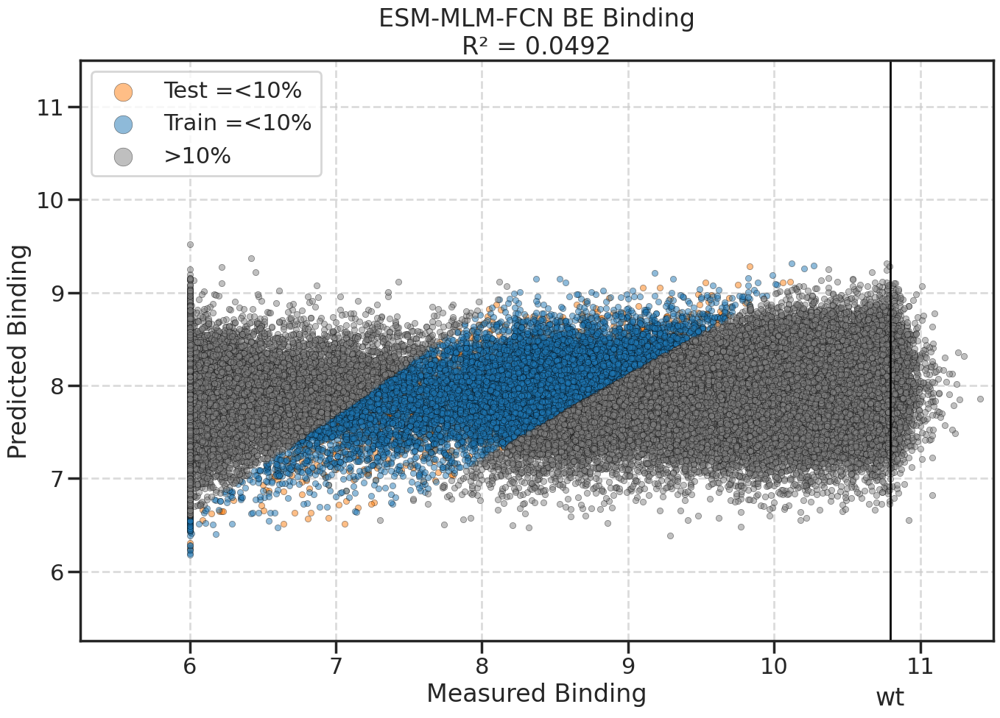

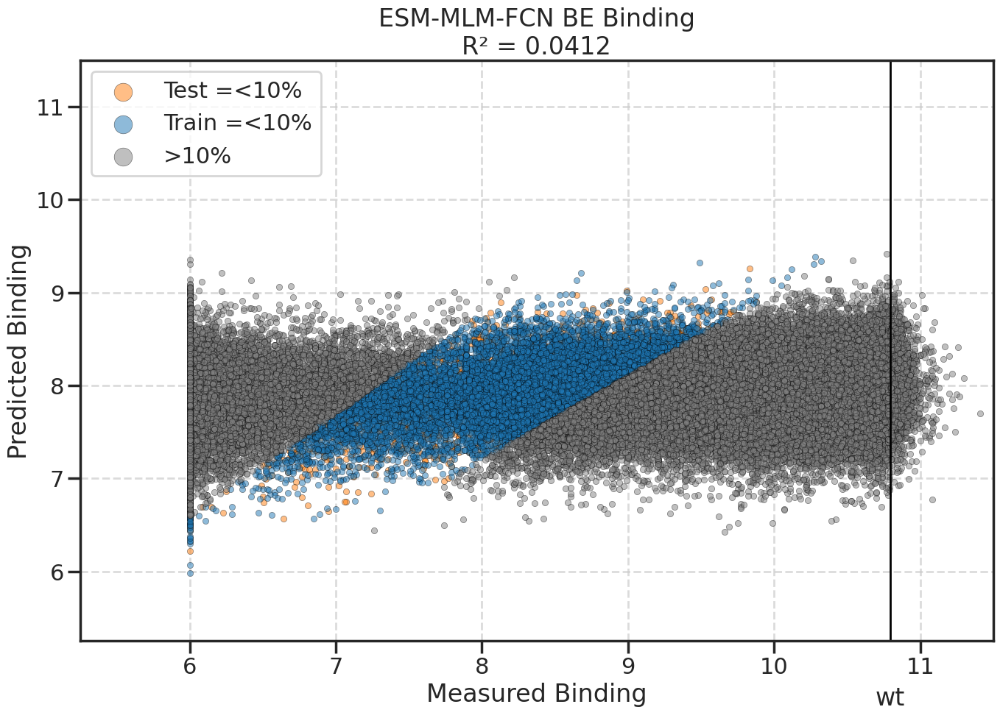

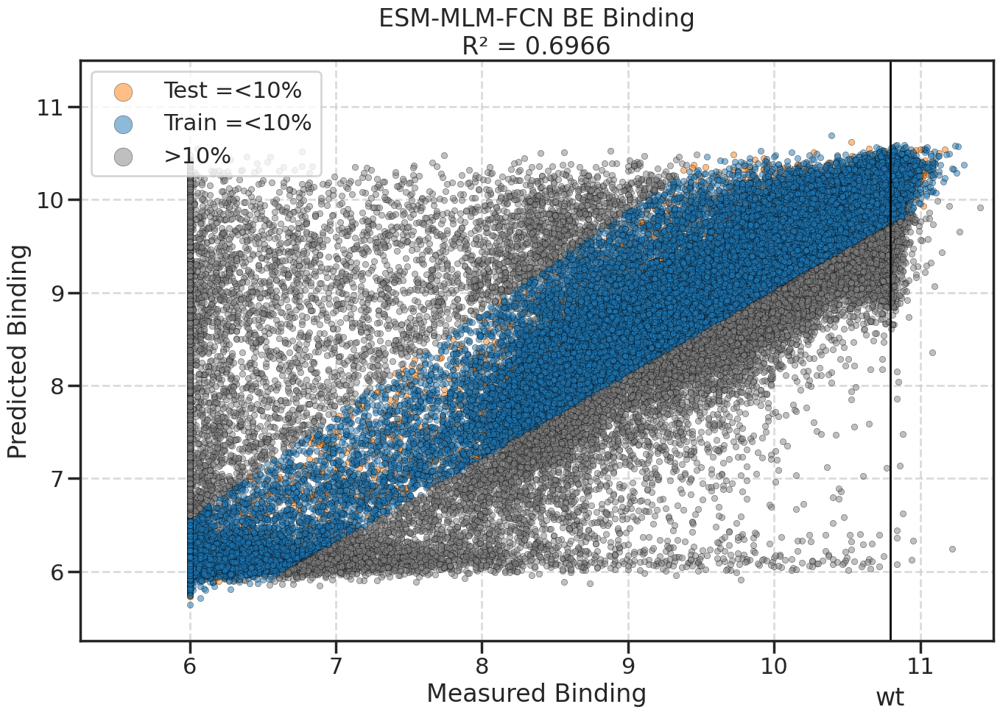

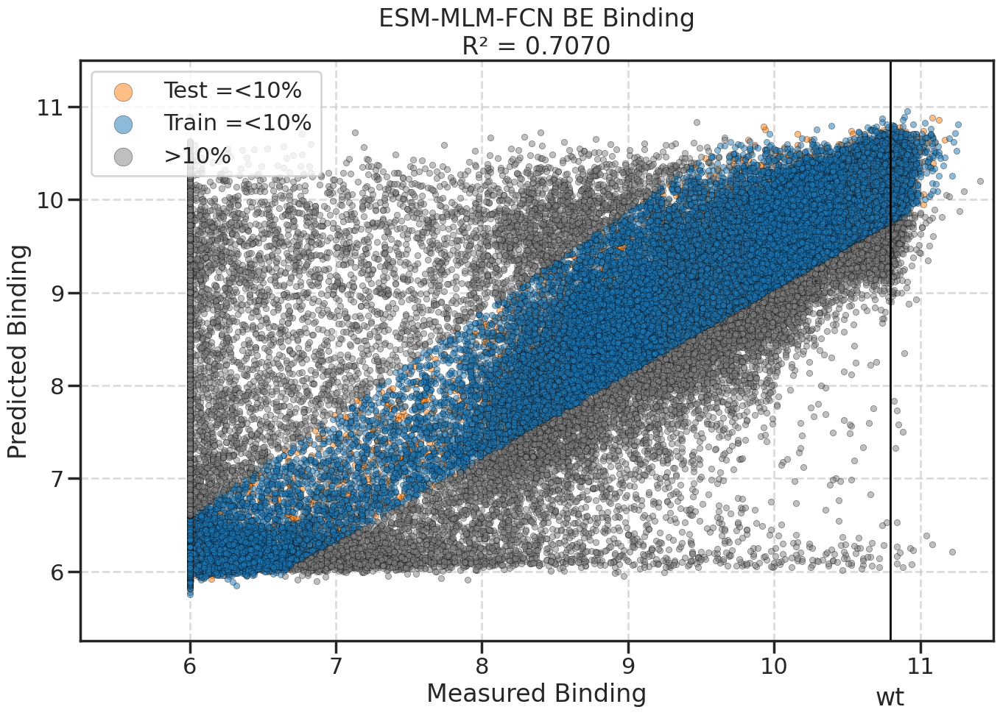

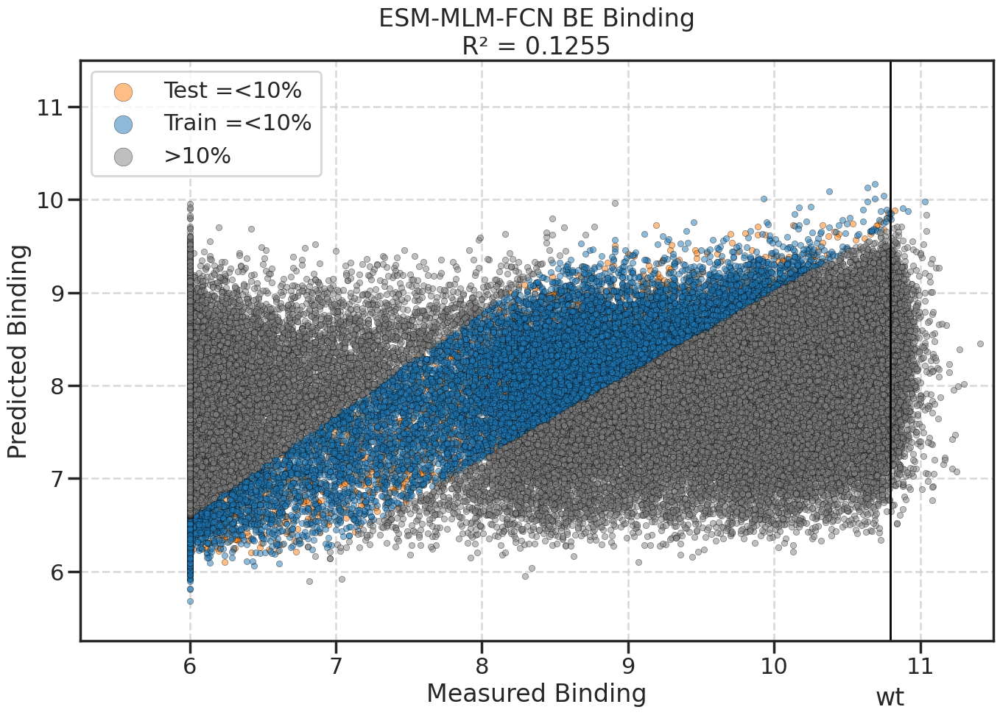

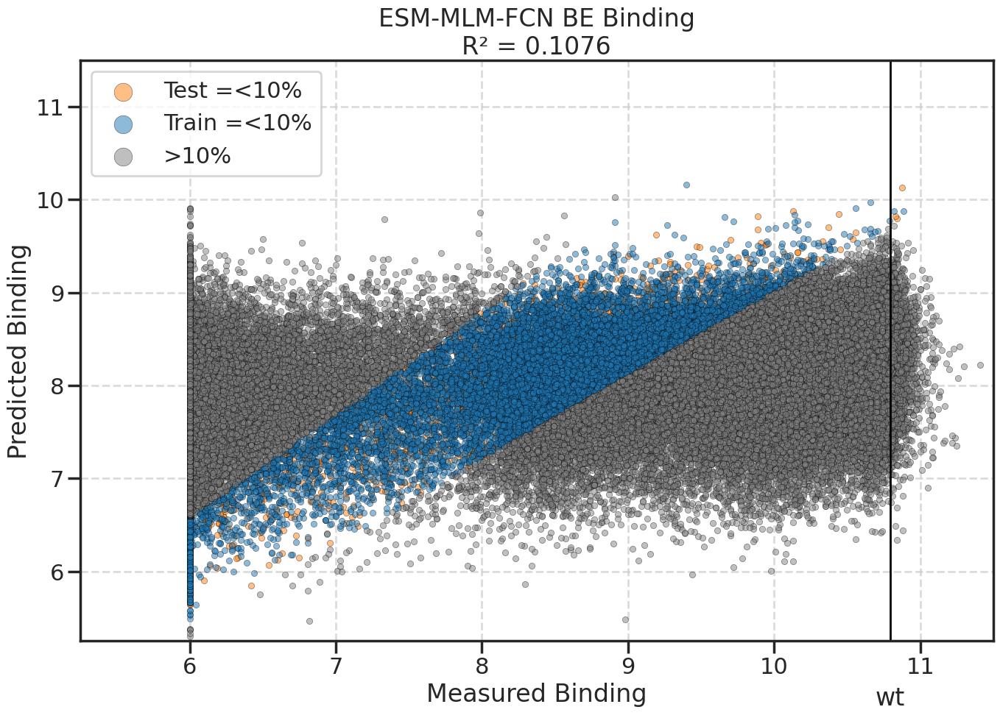

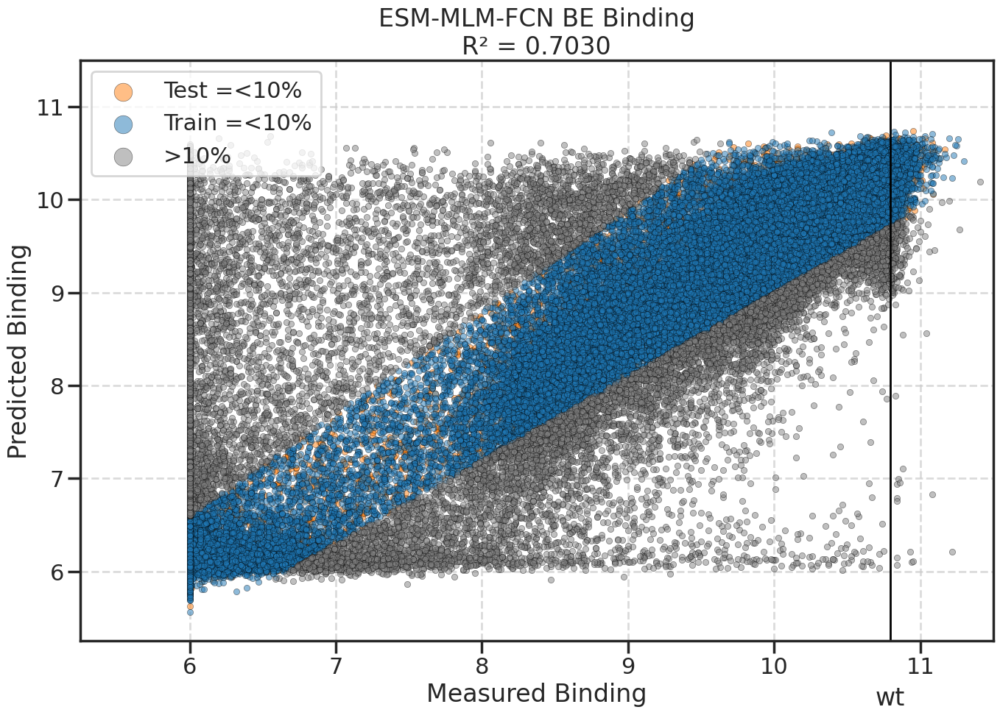

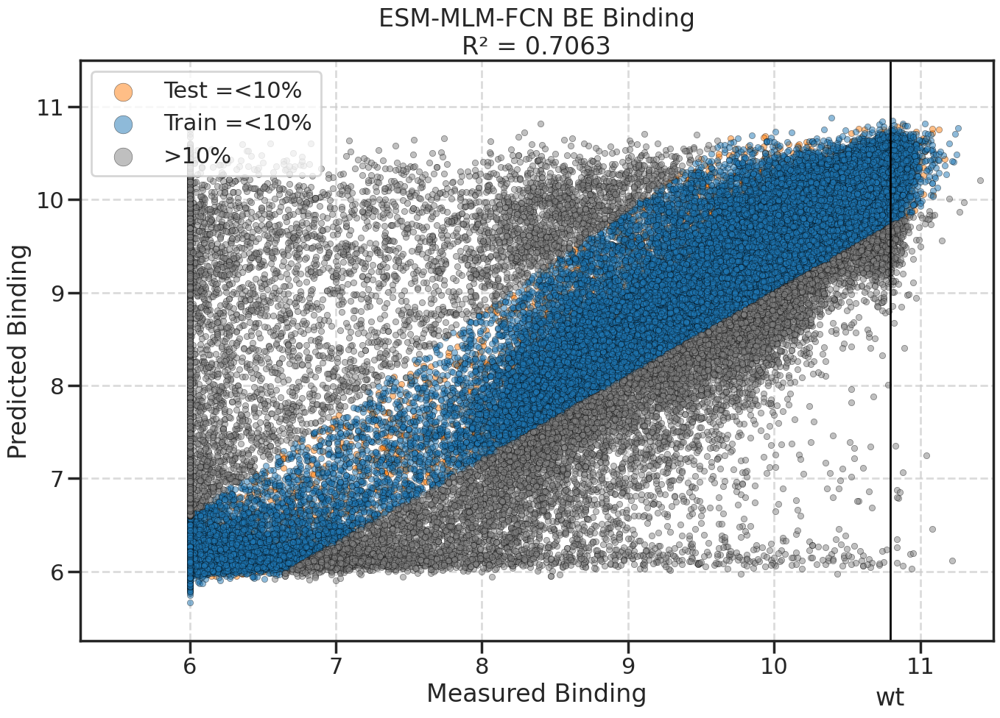

In [16]:
# Binding
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.A-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.A.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.B-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.B.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.C-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.C.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.D-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.D.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.E-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.E.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.F-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.F.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.G-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.G.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.H-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-MLM-FCN BE Binding", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.H.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.0431736655174394
R^2 outside of threshold: -0.0456824591377496
R^2 inside of threshold: 0.029695233183506975


R^2: 0.03242220735550605
R^2 outside of threshold: -0.05017685281825779
R^2 inside of threshold: -0.011328604713120471
R^2: 0.6582347034359611
R^2 outside of threshold: -0.3855216378641986
R^2 inside of threshold: 0.8403348150450141
R^2: 0.6576272648967074
R^2 outside of threshold: -0.48160138913514094
R^2 inside of threshold: 0.8430358036695893
R^2: 0.10573180767203016
R^2 outside of threshold: -0.03129473948507733
R^2 inside of threshold: 0.2798200241137956
R^2: 0.08536358741401617
R^2 outside of threshold: -0.012724577506006307
R^2 inside of threshold: 0.18990929799338374
R^2: 0.6514133011264409
R^2 outside of threshold: -1.0483990906082132
R^2 inside of threshold: 0.8529591152792173
R^2: 0.6612822178447828
R^2 outside of threshold: -1.1220269078809086
R^2 inside of threshold: 0.8611602418922683


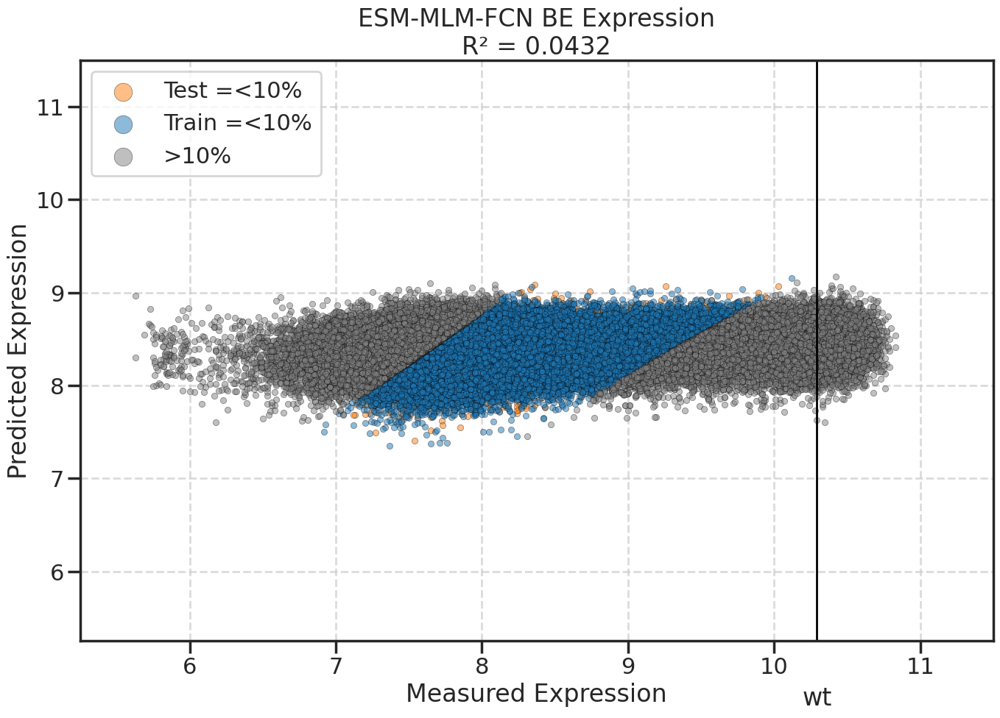

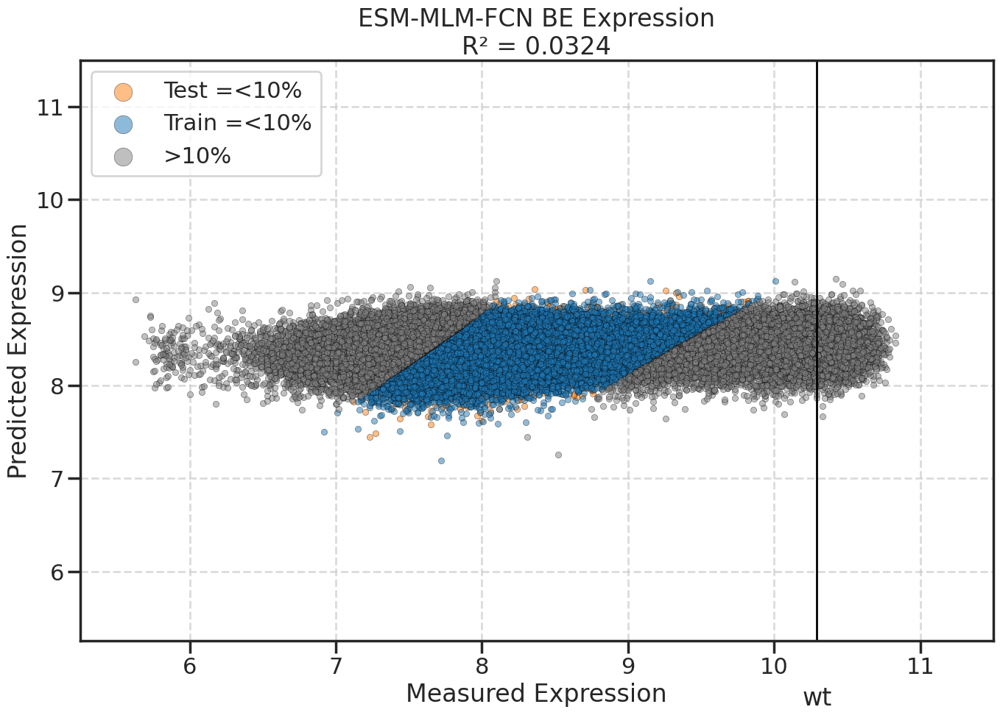

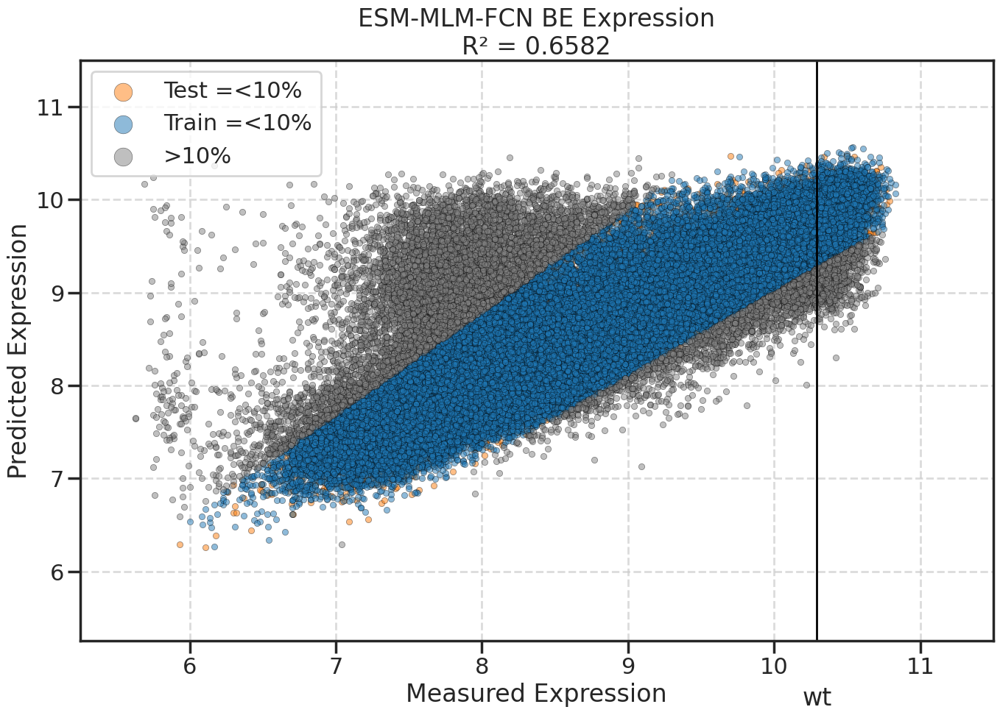

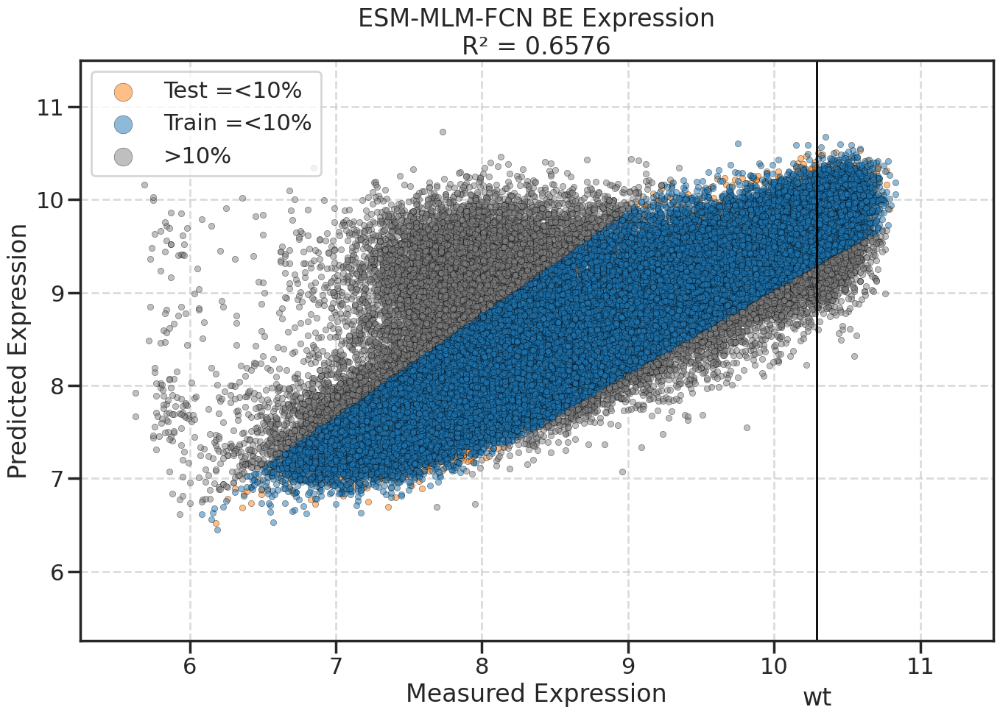

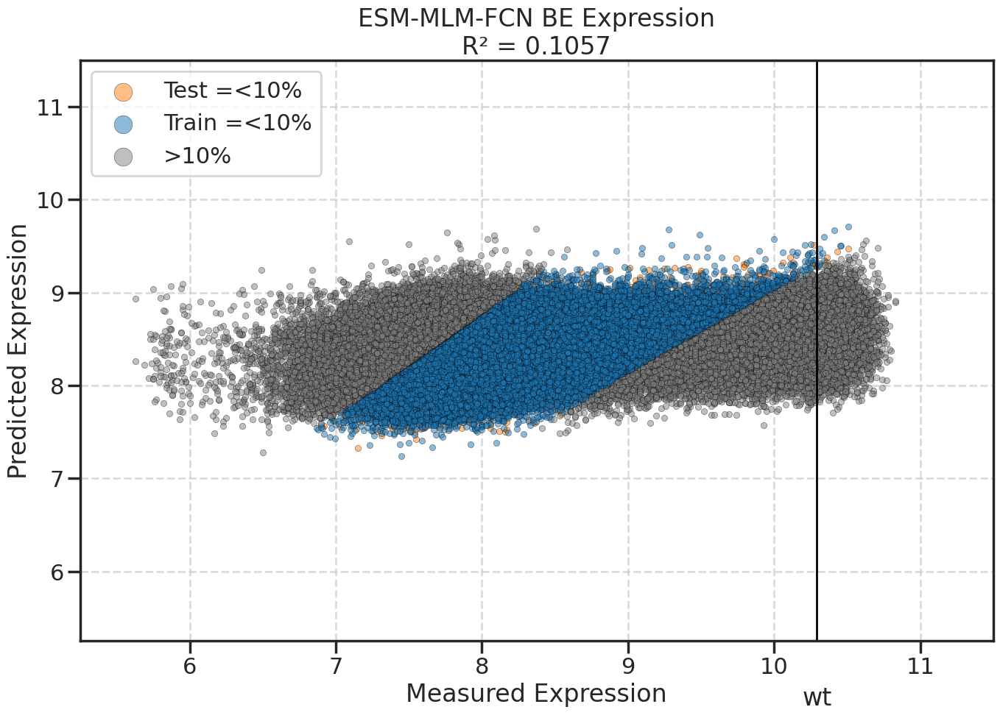

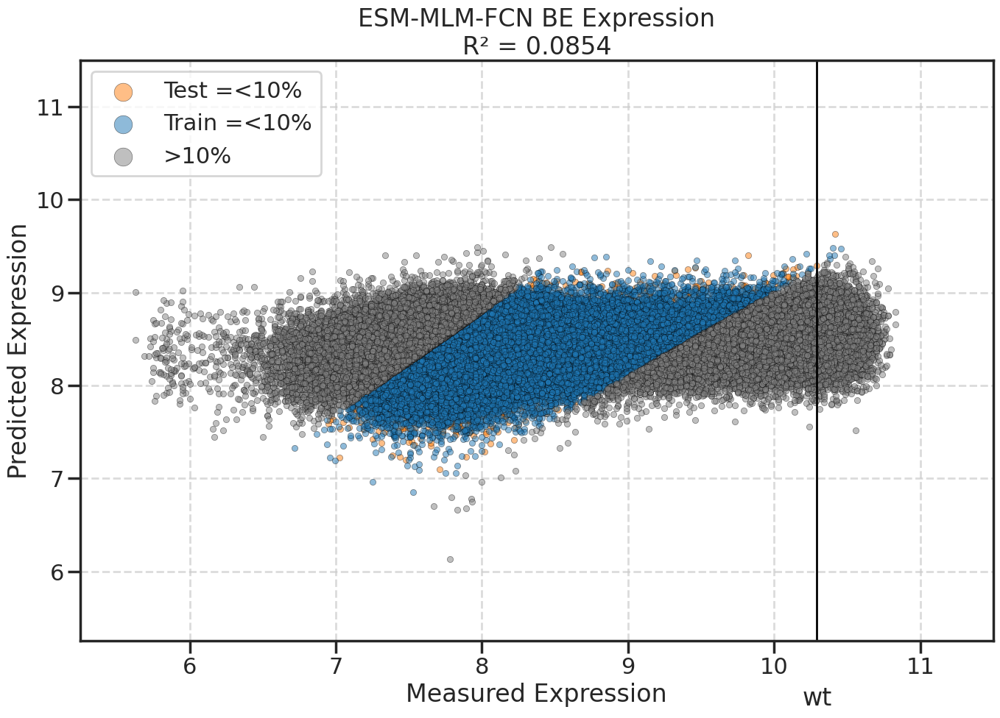

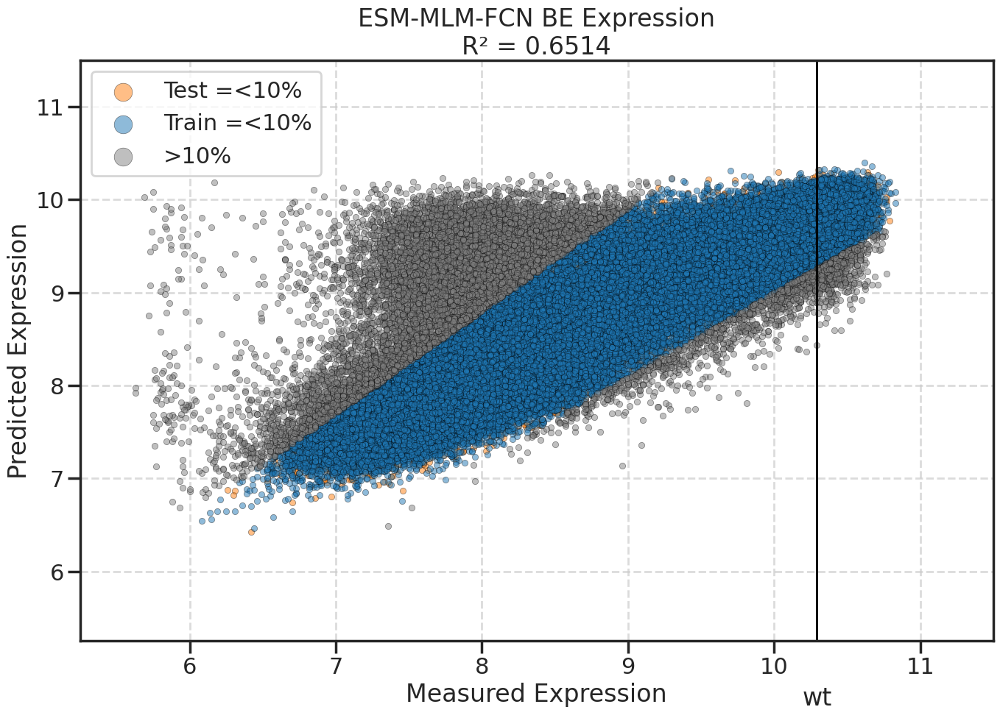

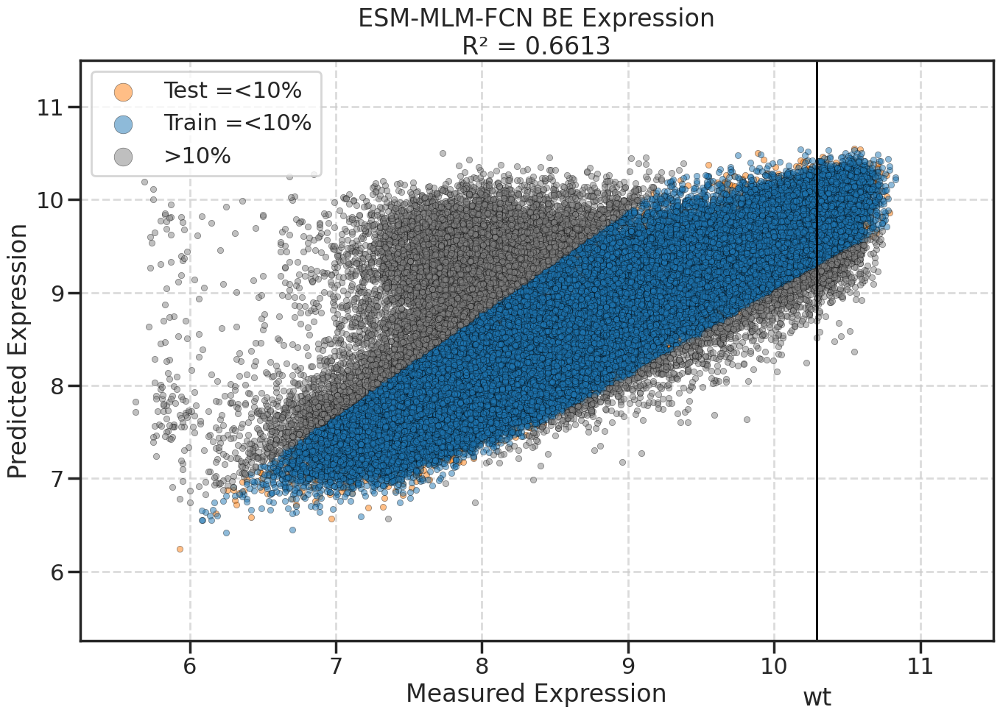

In [17]:
# Expression
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.A-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.A.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.B-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.B.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.C-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.C.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.D-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.D.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.E-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.E.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.F-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.F.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.G-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.G.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.H-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-MLM-FCN BE Expression", "scatter/esm_mlm_fcn_be/esm_mlm_fcn_be.H.expression-predicted_vs_measured.scatter", expression_wt)

---
### Bar Chart Stats

In [19]:
r2_dict = {
    "A.binding": esm_mlm_fcn_be_a_binding,
    "A.expression": esm_mlm_fcn_be_a_expression,
    "B.binding": esm_mlm_fcn_be_b_binding,
    "B.expression": esm_mlm_fcn_be_b_expression,
    "C.binding": esm_mlm_fcn_be_c_binding,
    "C.expression": esm_mlm_fcn_be_c_expression,
    "D.binding": esm_mlm_fcn_be_d_binding,
    "D.expression": esm_mlm_fcn_be_d_expression,
    "E.binding": esm_mlm_fcn_be_e_binding,
    "E.expression": esm_mlm_fcn_be_e_expression,
    "F.binding": esm_mlm_fcn_be_f_binding,
    "F.expression": esm_mlm_fcn_be_f_expression,
    "G.binding": esm_mlm_fcn_be_g_binding,
    "G.expression": esm_mlm_fcn_be_g_expression,
    "H.binding": esm_mlm_fcn_be_h_binding,
    "H.expression": esm_mlm_fcn_be_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")
print("")

# In Millions (M)
params_dict = {
    "A": 0.514,
    "B": 0.514,
    "C": 8.4,
    "D": 8.4,
    "E": 0.514,
    "F": 0.514,
    "G": 8.4,
    "H": 8.4,
}
for key, value in params_dict.items():
    print(f"{key}: {value}")
print("")

runtime_dict = {
    "A": "4:45:35",
    "B": "4:44:49",
    "C": "8:41:58",
    "D": "8:41:26",
    "E": "4:47:54",
    "F": "4:39:00",
    "G": "8:41:12",
    "H": "8:41:40",
}
for key, value in runtime_dict.items():
    print(f"{key}: {value}")
print("")

A.binding: 0.04923996283673293
A.expression: 0.0431736655174394
B.binding: 0.04124254167620289
B.expression: 0.03242220735550605
C.binding: 0.696575777756947
C.expression: 0.6582347034359611
D.binding: 0.7070337898638677
D.expression: 0.6576272648967074
E.binding: 0.1254744110703866
E.expression: 0.10573180767203016
F.binding: 0.10756980236171987
F.expression: 0.08536358741401617
G.binding: 0.7029550554673853
G.expression: 0.6514133011264409
H.binding: 0.7063155563328016
H.expression: 0.6612822178447828

A: 0.514
B: 0.514
C: 8.4
D: 8.4
E: 0.514
F: 0.514
G: 8.4
H: 8.4

A: 4:45:35
B: 4:44:49
C: 8:41:58
D: 8:41:26
E: 4:47:54
F: 4:39:00
G: 8:41:12
H: 8:41:40



---
### Best RMSE Plots (G BE)

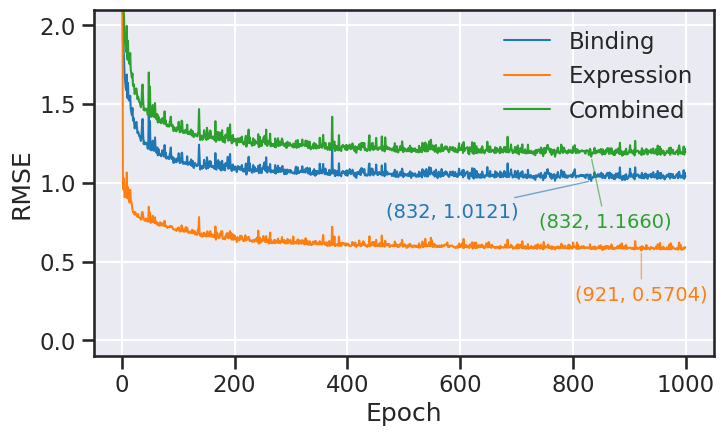

In [30]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../src/pnlp/ESM_TL/logs/"

df = pd.read_csv(
    os.path.join(log_dir, "esm_mlm_fcn_be/version_22049884/metrics.csv"), 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_be_rmse', 'val_binding_rmse','val_expression_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
merged_df = df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in merged_df.columns:
    merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
merged_df.loc[:, "epoch"] = (merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
merged_df = merged_df.sort_values("epoch").reset_index(drop=True)

binding_best_epoch = merged_df.loc[merged_df['val_binding_rmse'].idxmin()]
expression_best_epoch = merged_df.loc[merged_df['val_expression_rmse'].idxmin()]
be_best_epoch = merged_df.loc[merged_df['val_be_rmse'].idxmin()]

# Plot
sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(merged_df['epoch'], merged_df['val_binding_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(merged_df['epoch'], merged_df['val_expression_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.plot(merged_df['epoch'], merged_df['val_be_rmse'], label='Combined', color='tab:green', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)
plt.grid(axis="y", linestyle="-", alpha=1, color='white')
plt.grid(axis="x", linestyle="-", alpha=1, color='white')
ax.set_facecolor('#EAEAF2') 

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_binding_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_binding_rmse"]),
    textcoords="offset points", xytext=(-100, -15), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_expression_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_expression_rmse"]),
    textcoords="offset points", xytext=(0, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(be_best_epoch["epoch"])}, {be_best_epoch["val_be_rmse"]:.4f})',
    (be_best_epoch["epoch"], be_best_epoch["val_be_rmse"]),
    textcoords="offset points", xytext=(10, -40), ha='center', va='top', color='tab:green', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:green', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "rmse/best_esm_mlm_fcn_be-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')